In [1]:
suppressPackageStartupMessages(library(SingleCellExperiment))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(argparse))
suppressPackageStartupMessages(library(miloR))
suppressPackageStartupMessages(library(patchwork))

######################
## Define arguments ##
######################

# p <- ArgumentParser(description='')
# p$add_argument('--sce',             type="character",                               help='SingleCellExperiment file')
# p$add_argument('--metadata',        type="character",                               help='Cell metadata file')
# p$add_argument('--atlas_metadata',  type="character",                               help='Atlas metadata file')
# p$add_argument('--stage',           type="character",                               help='Stages to include')
# p$add_argument('--features',        type="integer",    default=2500,                help='Number of features')
# p$add_argument('--npcs',            type="integer",    default=50,                  help='Number of PCs')
# p$add_argument('--n_neighbors',     type="integer",    default=30,     help='Number of neighbours')
# p$add_argument('--tdTom_corr', action="character",                                 help='Keep tdTom+ cells in WT samples (otherwise removed)')
# p$add_argument('--prop',        type="double",     default=0.3,     help='Proportion of cells to sample for MILO')
# #p$add_argument('--remove_ExE_cells', action="store_true",                                 help='Remove ExE cells?')
# p$add_argument('--outdir',          type="character",                               help='Output file')

# args <- p$parse_args(commandArgs(TRUE))

In [208]:
#####################
## Define settings ##
#####################
here::i_am("processing/1_create_seurat_rna.R")
source(here::here("settings.R"))
source(here::here("utils.R"))
source(here::here("mapping/run/mnn/mapping_functions.R"))
test = TRUE

if(test){
## START TEST ##
    args = list()
args$sce <- io$rna.sce
args$metadata <- io$metadata
args$stage <- c('E9.5')#, 'E8.5', 'E9.5')
args$metadata <- paste0(io$basedir,"/results/rna/mapping/sample_metadata_after_mapping.txt.gz")
args$atlas_metadata <- "/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/extended/sample_metadata.txt.gz"
args$features <- 2000
args$npcs <- 30 
args$regression = TRUE
args$batch_correction = TRUE
args$n_neighbors = 35 
args$prop = 0.15 # put at 0.15 - 0.2
args$remove_ExE_cells <- FALSE
args$tdTom_corr = "FALSE"
args$outdir <- paste0(io$basedir,"/results/rna/MiloR/test")
## END TEST ##
}

# If passing multiple timepoints split in vector
args$stage = strsplit(args$stage, "_")[[1]] 

dir.create(args$outdir, recursive=TRUE, showWarnings = FALSE)

set.seed(1234)

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/03_Stat3_RNA/code



In [453]:
##########################
## Load sample metadata ##
##########################

sample_metadata <- fread(args$metadata) %>%
   .[pass_rnaQC==TRUE & doublet_call==FALSE & stage %in% args$stage] %>%
    .[,pool:=stringr::str_replace_all(sample,opts$sample2pool)]


if(args$tdTom_corr!='TRUE'){
    sample_metadata = sample_metadata[tdTom==tdTom_corr]
}

if(test){
    sample_metadata = sample_metadata[sample(1:nrow(sample_metadata), nrow(sample_metadata)/1)]
}

In [454]:
###############
## Load data ##
###############

# Load RNA expression data as SingleCellExperiment object
sce <- load_SingleCellExperiment(args$sce, cells=sample_metadata$cell, normalise = TRUE)

# Add sample metadata as colData
colData(sce) <- sample_metadata %>% tibble::column_to_rownames("cell") %>% DataFrame

In [455]:
## Find HVGs - detection on WT samples only
# Get gene metadata
gene_metadata <- fread(io$gene_metadata) %>% .[,c("chr","ens_id","symbol")] %>%
  .[symbol!="" & ens_id%in%rownames(sce)] %>%
  .[!duplicated(symbol)]

decomp <- modelGeneVar(sce[,sample_metadata[tdTom==FALSE, cell]], block=colData(sce[,sample_metadata[tdTom==FALSE, cell]])$sample) # Only detect HVGs from WT samples
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>% 
    as.data.table(., keep.rownames=T) %>% 
    .[grep("^Rik|Rik$|^mt-|^Rps|^Rpl|^Gm",rn,invert=T)] %>% # filter out non-informative genes
    .[grep("^Hbb|^Hba",rn,invert=T)] %>% # test removing Haem genes 
    .[!rn %in% c('Sfrp1', 'Grb10', 'H19', 'Peg10', 'Peg3', 'Nnat')] %>% # re-occuring batch genes
    .[!rn %in% c("Xist", "Tsix")] %>%  # remove Xist & Tsix
    .[!rn=="tomato-td"] %>% # remove tomato itself
    .[!rn%in%gene_metadata[chr=="chrY",symbol]] %>%
     head(n=args$features) %>% .$rn

sce_filt <- sce[hvgs,]

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


In [331]:
head(hvgs, 100)

[1] "Tmsb4x"    "Crabp1"    "Hist1h1b"  "Ptn"       "Vim"       "Ckb"      
  [7] "Meg3"      "Mest"      "Slc4a1"    "Malat1"    "Crabp2"    "Alas2"    
 [13] "Map1b"     "Gypa"      "Ccnd2"     "Myh6"      "Hist1h2ap" "Csrp3"    
 [19] "Dlk1"      "Id3"       "Cdkn1c"    "Tpm1"      "Cited4"    "Twist1"   
 [25] "Top2a"     "Tyrobp"    "Lyve1"     "Myog"      "Ankrd1"    "Fgb"      
 [31] "Ctss"      "Ttn"       "Hemgn"     "Sox2"      "Igfbp5"    "Myl4"     
 [37] "Cldn5"     "Krt15"     "Col3a1"    "Phox2b"    "Cenpf"     "Tubb2b"   
 [43] "Lgals2"    "Spp2"      "Apoa2"     "Ttr"       "Epcam"     "Emcn"     
 [49] "Lyz2"      "Ermap"     "Dppa3"     "Krt8"      "Mt1"       "Acta2"    
 [55] "Nepn"      "Tnnt2"     "C1qb"      "Stab2"     "Tac2"      "Fcer1g"   
 [61] "Barx1"     "Ifi202b"   "Mpo"       "Lgals3"    "Lum"       "Cybb"     
 [67] "Pyy"       "Krt18"     "Tmsb10"    "Cd52"      "Six6"      "Tuba1a"   
 [73] "Klf1"      "C1qc"      "Gp5"       "Afp"       "Igf2"      "C1qa"     
 [79] "Car2"      "Col1a1"    "Plek"      "Spi1"      "Ambp"      "Mrc1"     
 [85] "Myl3"      "Ube2c"     "Gp1bb"     "Ctla2a"    "Actc1"     "Blvrb"    
 [91] "Spta1"     "Aqp8"      "Tubb3"     "Wnt6"      "Tnnc1"     "Pclaf"    
 [97] "Csf2rb"    "Clec1b"    "Myl7"      "Ly6g6f"

In [332]:
sce_filt_bu = sce_filt

In [333]:
if(args$regression){
   args$vars_to_regress = c('nFeature_RNA', 'nCount_RNA') # , 'mitochondrial_percent_RNA', 'ribosomal_percent_RNA'
   print(sprintf("Regressing out variables: %s", paste(args$vars_to_regress,collapse=" ")))
   logcounts(sce_filt) <- RegressOutMatrix(
     mtx = logcounts(sce_filt), 
     covariates = colData(sce_filt)[,args$vars_to_regress,drop=F]
   )
}

[1] "Regressing out variables: nFeature_RNA nCount_RNA"


In [335]:
sce_filt <- runPCA(sce_filt, ncomponents = args$npcs, ntop=args$features)  

sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = args$n_neighbors, min_dist = 0.3)


In [336]:
pca.dt = reducedDim(sce_filt,"PCA") %>% as.data.table %>% 
  .[,tdTom:=colData(sce_filt)$tdTom] %>%
  melt(., id.vars = c("tdTom"),
               variable.name = "PC", value.name = "value")

In [337]:
rotation = attributes(sce_filt@int_colData$reducedDims$PCA)$rotation

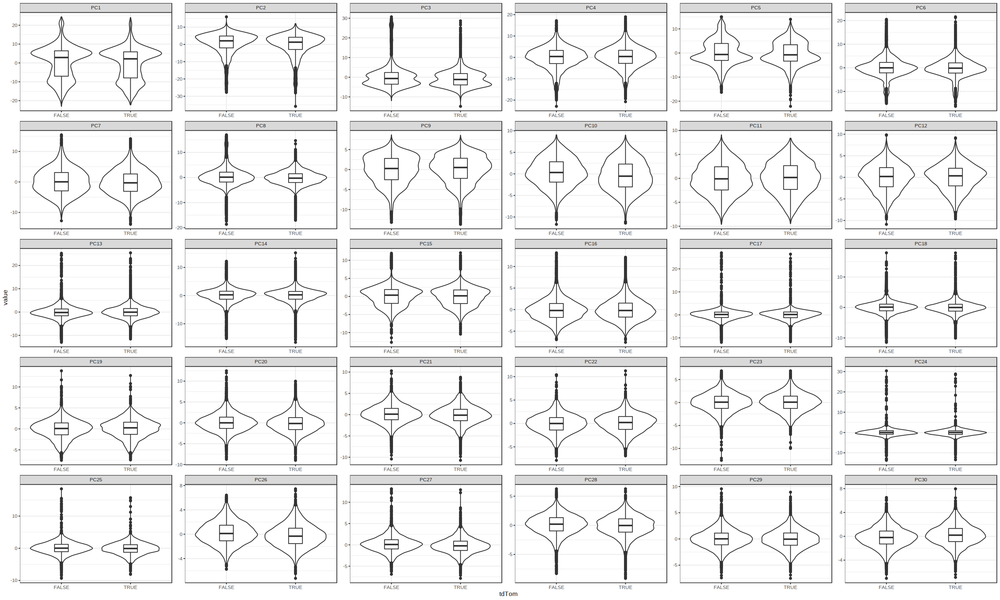

In [338]:
options(repr.plot.width=25, repr.plot.height=15)

ggplot(pca.dt, aes(tdTom, value)) + 
    geom_violin() + 
    geom_boxplot(width=0.2) + 
    facet_wrap(~PC, scales='free') + 
    theme_bw()

In [340]:
# head(rownames(rotation[order(rotation[,14]),]), 20)

In [341]:
pca.dt = reducedDim(sce_filt,"PCA") %>% as.data.table %>% 
  .[,tdTom:=colData(sce_filt)$tdTom]

In [342]:
# Fetch UMAP coordinates
umap.dt <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
  .[,cell:=colnames(sce_filt)] %>%
  setnames(c("UMAP1","UMAP2","cell"))

In [343]:
to.plot <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
    .[,cell:=colnames(sce_filt)] %>%
    merge(sample_metadata, by="cell")

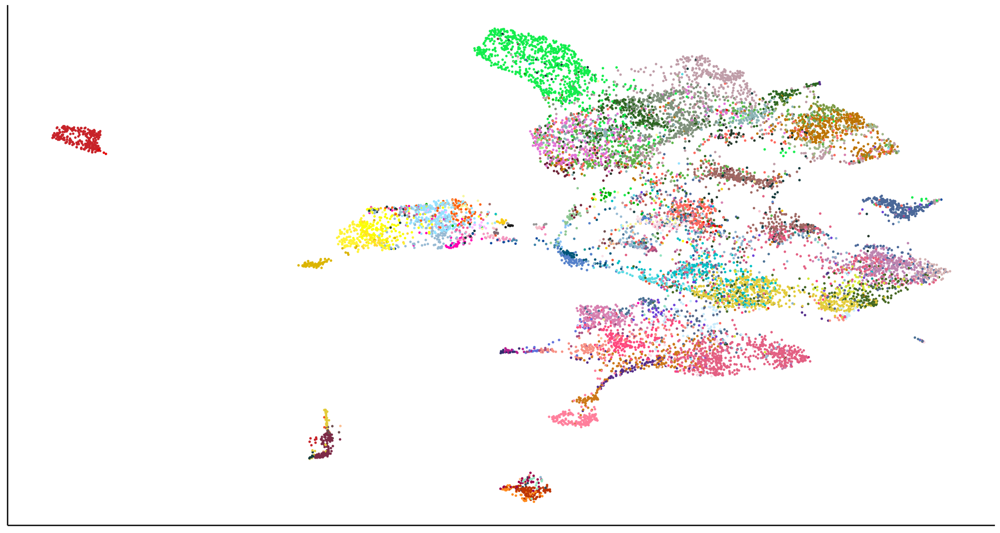

In [344]:
options(repr.plot.width=10, repr.plot.height=6)

ggplot(to.plot, aes_string(x="V1", y="V2", col='celltype.mapped_mnn')) +
    geom_point(size=0.2) +
    theme_classic() +
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank()
    ) + scale_color_manual(values=opts$celltype.colors) +
      theme(
        legend.position="none",
        legend.title=element_blank())

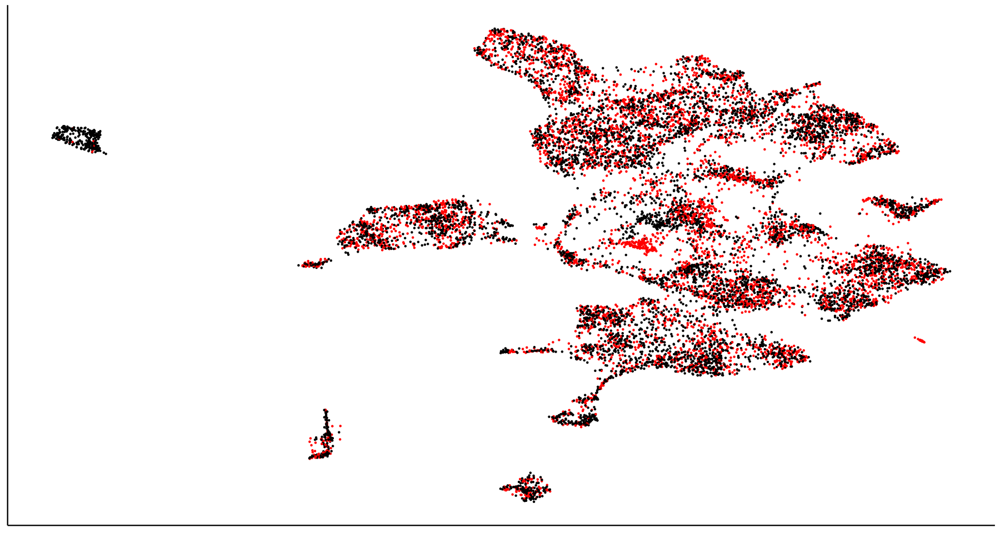

In [345]:
ggplot(to.plot, aes_string(x="V1", y="V2", col='tdTom')) +
    geom_point(size=0.2) +
    theme_classic() +
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank()
    ) + scale_color_manual(values=c('TRUE'= 'red', 'FALSE'='black')) +
      theme(
        legend.position="none",
        legend.title=element_blank())

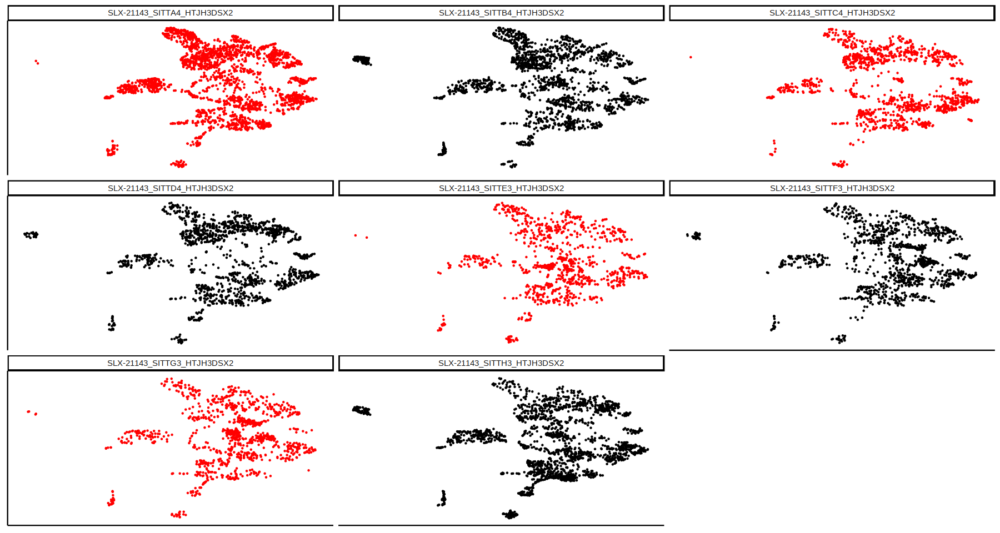

In [346]:
options(repr.plot.width=15, repr.plot.height=8)
ggplot(to.plot, aes_string(x="V1", y="V2", col='tdTom')) +
    geom_point(size=0.2) +
    theme_classic() +
    facet_wrap(~sample) + 
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank()
    ) + scale_color_manual(values=c('TRUE'= 'red', 'FALSE'='black')) +
      theme(
        legend.position="none",
        legend.title=element_blank())

In [347]:
########################
## Create MILO object ##
########################

# create object
Milo_sce <- Milo(sce_filt)

colData(Milo_sce)$sample_ko = paste0(colData(Milo_sce)$sample, '_',  colData(Milo_sce)$tdTom_corr)

# Build graph
Milo_sce <- buildGraph(Milo_sce, 
                       k = args$n_neighbors, 
                       d = args$npcs, 
                       reduced.dim = "PCA")

# Identify neighbourhoods from NN-cells
# lower prop for larger datasets
Milo_sce <- makeNhoods(Milo_sce, 
                       prop = args$prop, 
                       k = args$n_neighbors, 
                       d = args$npcs, 
                       refined = TRUE, 
                       reduced_dims = "PCA")

Constructing kNN graph with k:35

Checking valid object



In [348]:
# count cells of different samples per neighbourhood
Milo_sce <- countCells(Milo_sce, meta.data = as.data.frame(colData(Milo_sce)), sample="sample_ko")

# Calculate Neighbourhood Distances (most time consuming step)
Milo_sce <- calcNhoodDistance(Milo_sce, d=args$npcs, reduced.dim = "pca")

# Build neighbourhood graph
Milo_sce <- buildNhoodGraph(Milo_sce)

# Save MILO object
# outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s.rds",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
# saveRDS(Milo_sce, outfile)

# Embryo design table
embryo_design <- data.frame(colData(Milo_sce))[,c("sample_ko", "sample", 'tdTom_corr', 'tdTom', 'pool')]

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_ko



Checking meta.data validity

Counting cells in neighbourhoods



In [349]:
embryo_design

,sample_ko,sample,tdTom_corr,tdTom,pool
,<chr>,<chr>,<lgl>,<lgl>,<chr>
SLX-21143_SITTB4_HTJH3DSX2_FALSE,SLX-21143_SITTB4_HTJH3DSX2_FALSE,SLX-21143_SITTB4_HTJH3DSX2,FALSE,FALSE,E9.5_rep3
SLX-21143_SITTF3_HTJH3DSX2_FALSE,SLX-21143_SITTF3_HTJH3DSX2_FALSE,SLX-21143_SITTF3_HTJH3DSX2,FALSE,FALSE,E9.5_rep1
SLX-21143_SITTA4_HTJH3DSX2_TRUE,SLX-21143_SITTA4_HTJH3DSX2_TRUE,SLX-21143_SITTA4_HTJH3DSX2,TRUE,TRUE,E9.5_rep3
SLX-21143_SITTD4_HTJH3DSX2_FALSE,SLX-21143_SITTD4_HTJH3DSX2_FALSE,SLX-21143_SITTD4_HTJH3DSX2,FALSE,FALSE,E9.5_rep4
SLX-21143_SITTG3_HTJH3DSX2_TRUE,SLX-21143_SITTG3_HTJH3DSX2_TRUE,SLX-21143_SITTG3_HTJH3DSX2,TRUE,TRUE,E9.5_rep2
SLX-21143_SITTH3_HTJH3DSX2_FALSE,SLX-21143_SITTH3_HTJH3DSX2_FALSE,SLX-21143_SITTH3_HTJH3DSX2,FALSE,FALSE,E9.5_rep2
SLX-21143_SITTE3_HTJH3DSX2_TRUE,SLX-21143_SITTE3_HTJH3DSX2_TRUE,SLX-21143_SITTE3_HTJH3DSX2,TRUE,TRUE,E9.5_rep1
SLX-21143_SITTC4_HTJH3DSX2_TRUE,SLX-21143_SITTC4_HTJH3DSX2_TRUE,SLX-21143_SITTC4_HTJH3DSX2,TRUE,TRUE,E9.5_rep4


In [350]:
# Test differential abundance per hood
# Correction per stage skipped because this info is present in the pool, which also corrects for differences between embryos of the same stage
da_results <- testNhoods(Milo_sce, design = ~ pool + tdTom_corr, design.df = embryo_design, reduced.dim="PCA")

# Save MILO results
# outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_DAresults.csv",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
# write.csv(da_results, outfile, row.names=FALSE)

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Warning message:
“ggrepel: 39 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


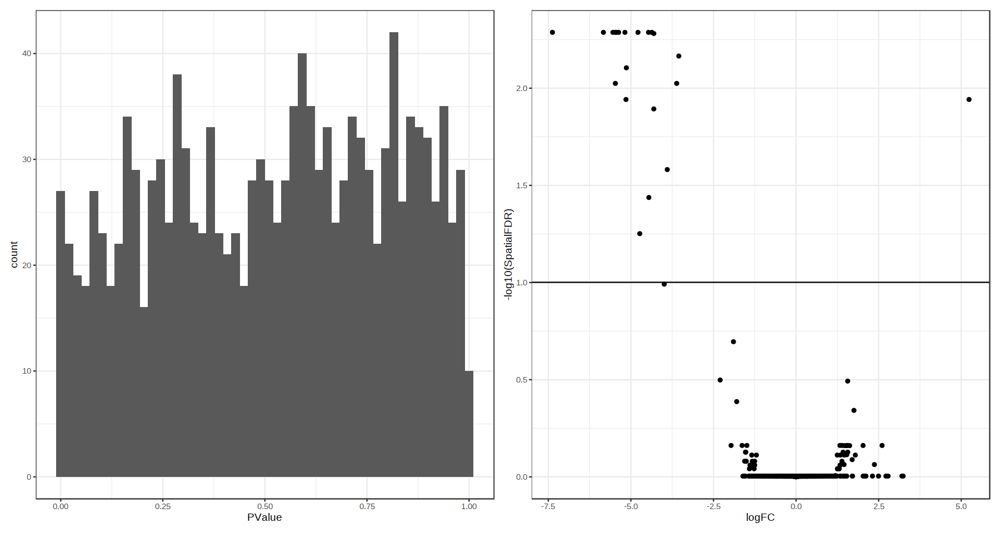

Converting celltype.mapped_mnn to factor...

Converting group.by to factor...



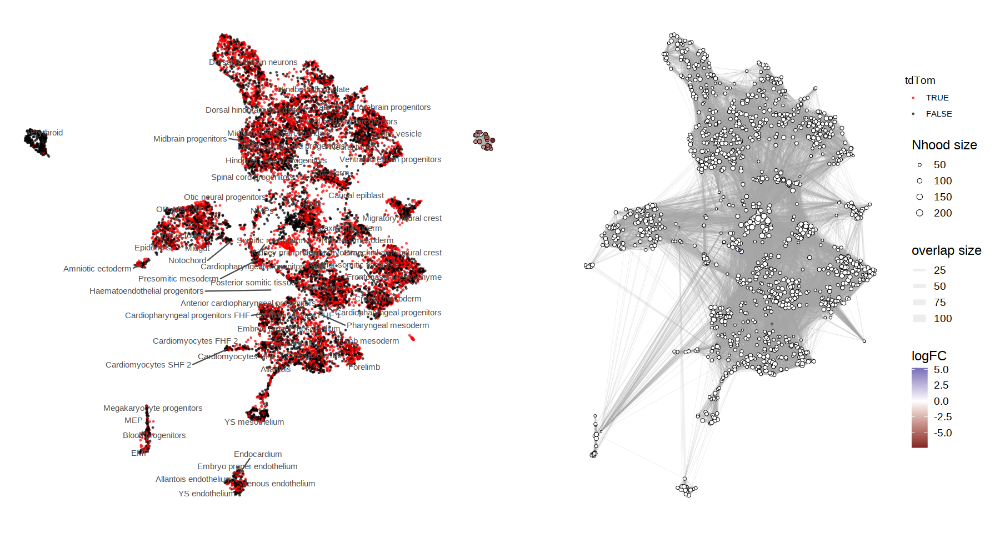

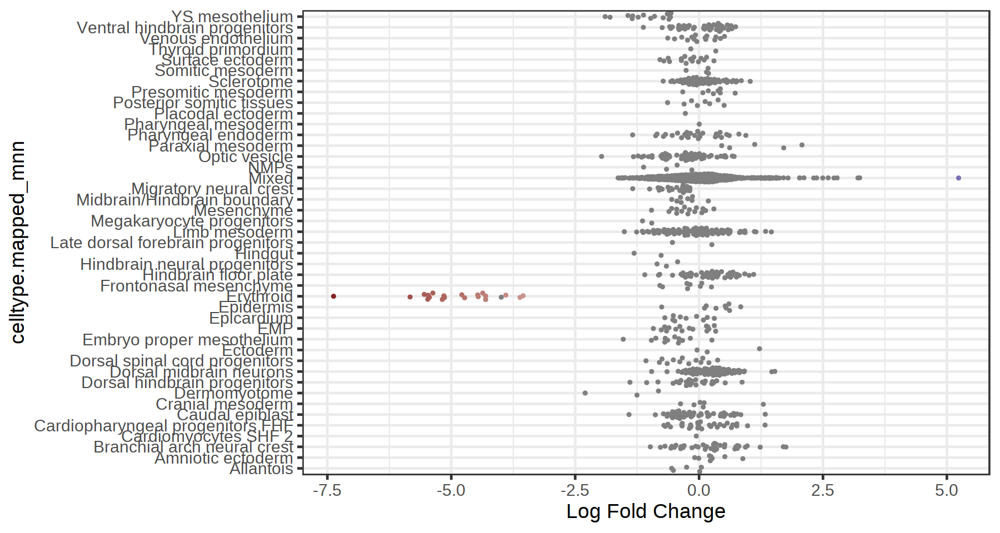

In [351]:
##################
## Plot results ##
##################

p1 = ggplot(da_results, aes(PValue)) + 
    geom_histogram(bins=50) + 
    theme_bw()

p2 = ggplot(da_results, aes(logFC, -log10(SpatialFDR))) + 
    geom_point() +
    geom_hline(yintercept = 1) + ## Mark significance threshold (10% FDR)
    theme_bw()


## Plot single-cell UMAP
p3 = plotReducedDim(Milo_sce, dimred = "UMAP", colour_by="tdTom_corr", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.3, text_colour = "grey30") +
    scale_color_manual(values=opts$tdTom.color, name = 'tdTom') + 
    theme_void() + 
    theme(legend.position='right') +
    guides(fill="none")

## Plot neighbourhood graph
p4 = plotNhoodGraphDA(Milo_sce, da_results, layout="UMAP",alpha=0.05) 

# # plot stats + graphs
# outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_plots.pdf",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
# pdf(outfile, width=14, height = 7)
#     p1 + p2
#     p3 + p4 +
#       plot_layout(guides="collect")
# dev.off()

# # If significant results create beeswarm plot
# if(TRUE %in% unique(da_results$SpatialFDR < 0.05)){
#     # Find Neighbourhood groups
#     da_results <- groupNhoods(Milo_sce, da_results, max.lfc.delta = 0.5, overlap = 20)

#     # Annotate hoods by celltype
#     da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")

#     # Annotate 'mixed' hoods when there is not one main celltype
#     da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.55, "Mixed", da_results$celltype.mapped_mnn)

#     # Save MILO object
#     outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_DAresults.csv",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
#     write.csv(da_results, outfile, row.names=FALSE)
    
#     # plot DA beeswarm
#     p6 = plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")

#     # # save beeswarm
#     outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_beeswarm.pdf",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
#     pdf(outfile, width=14, height = length(unique(da_results$celltype.mapped_mnn))/2.5)
#         print(p6)
#     dev.off()
# }

    p1 + p2
    p3 + p4 +
      plot_layout(guides="collect")

da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")
da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.5, "Mixed", da_results$celltype.mapped_mnn)
p6 = plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")
p6

In [352]:
# Test differential abundance per hood
# Correction per stage skipped because this info is present in the pool, which also corrects for differences between embryos of the same stage
da_results <- testNhoods(Milo_sce, design = ~ tdTom_corr, design.df = embryo_design, reduced.dim="PCA")

# Save MILO results
# outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_DAresults.csv",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
# write.csv(da_results, outfile, row.names=FALSE)

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Warning message:
“ggrepel: 39 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


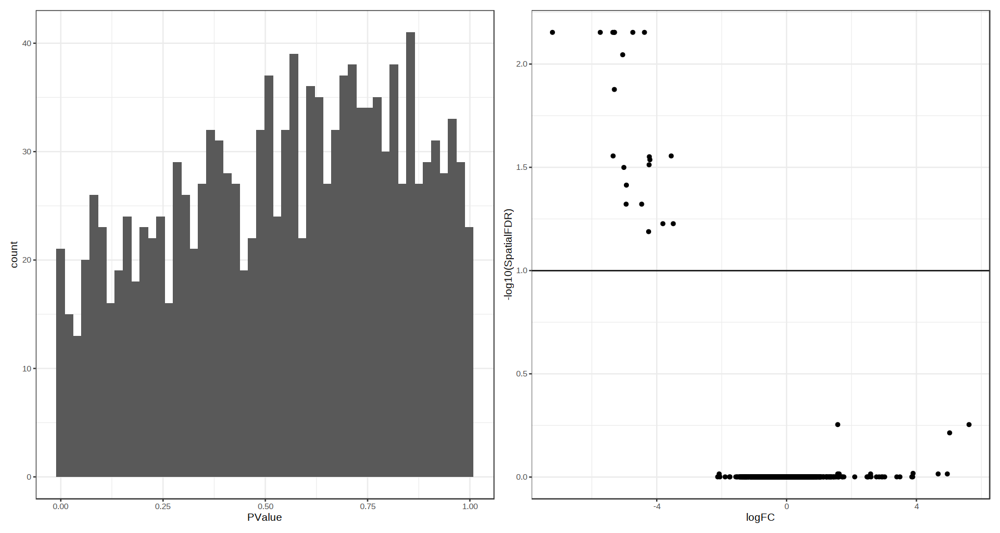

Converting celltype.mapped_mnn to factor...

Converting group.by to factor...



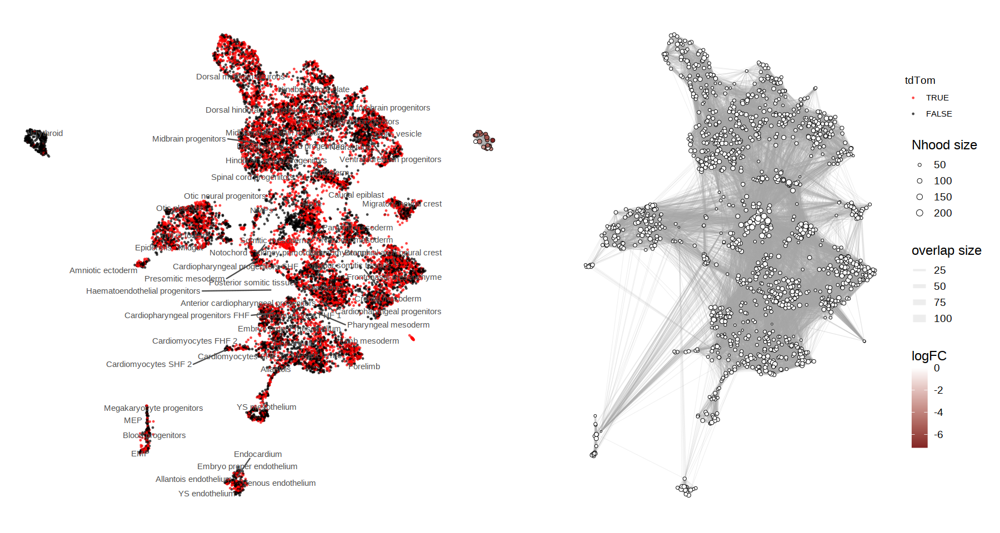

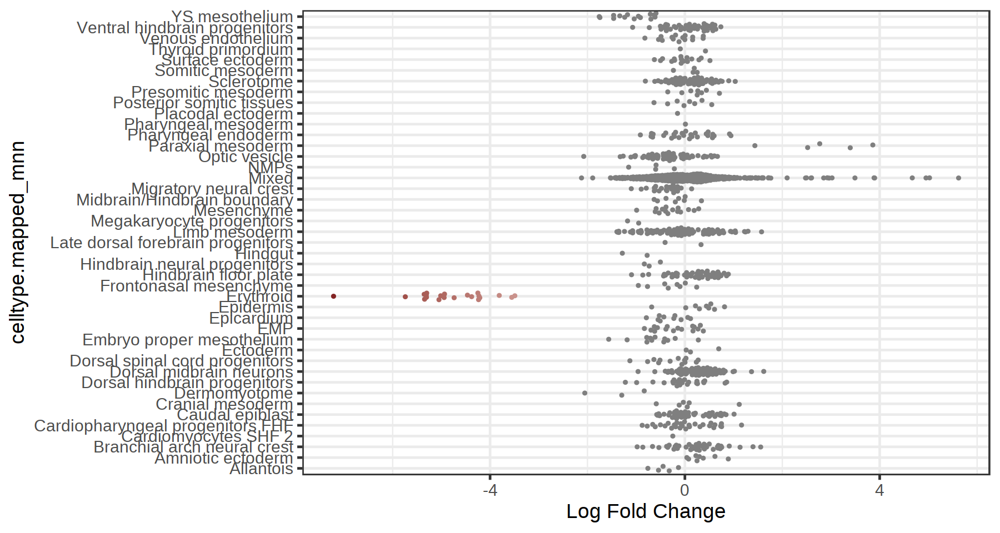

In [353]:
##################
## Plot results ##
##################

p1 = ggplot(da_results, aes(PValue)) + 
    geom_histogram(bins=50) + 
    theme_bw()

p2 = ggplot(da_results, aes(logFC, -log10(SpatialFDR))) + 
    geom_point() +
    geom_hline(yintercept = 1) + ## Mark significance threshold (10% FDR)
    theme_bw()


## Plot single-cell UMAP
p3 = plotReducedDim(Milo_sce, dimred = "UMAP", colour_by="tdTom_corr", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.3, text_colour = "grey30") +
    scale_color_manual(values=opts$tdTom.color, name = 'tdTom') + 
    theme_void() + 
    theme(legend.position='right') +
    guides(fill="none")

## Plot neighbourhood graph
p4 = plotNhoodGraphDA(Milo_sce, da_results, layout="UMAP",alpha=0.05) 

# # plot stats + graphs
# outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_plots.pdf",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
# pdf(outfile, width=14, height = 7)
#     p1 + p2
#     p3 + p4 +
#       plot_layout(guides="collect")
# dev.off()

# # If significant results create beeswarm plot
# if(TRUE %in% unique(da_results$SpatialFDR < 0.05)){
#     # Find Neighbourhood groups
#     da_results <- groupNhoods(Milo_sce, da_results, max.lfc.delta = 0.5, overlap = 20)

#     # Annotate hoods by celltype
#     da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")

#     # Annotate 'mixed' hoods when there is not one main celltype
#     da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.55, "Mixed", da_results$celltype.mapped_mnn)

#     # Save MILO object
#     outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_DAresults.csv",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
#     write.csv(da_results, outfile, row.names=FALSE)
    
#     # plot DA beeswarm
#     p6 = plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")

#     # # save beeswarm
#     outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_beeswarm.pdf",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
#     pdf(outfile, width=14, height = length(unique(da_results$celltype.mapped_mnn))/2.5)
#         print(p6)
#     dev.off()
# }

    p1 + p2
    p3 + p4 +
      plot_layout(guides="collect")

da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")
da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.5, "Mixed", da_results$celltype.mapped_mnn)
p6 = plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")
p6

# Batch Correction

In [354]:
## Find HVGs - detection on WT samples only
# Get gene metadata
gene_metadata <- fread(io$gene_metadata) %>% .[,c("chr","ens_id","symbol")] %>%
  .[symbol!="" & ens_id%in%rownames(sce)] %>%
  .[!duplicated(symbol)]

decomp <- modelGeneVar(sce[,sample_metadata[tdTom==FALSE, cell]], block=colData(sce[,sample_metadata[tdTom==FALSE, cell]])$sample) # Only detect HVGs from WT samples
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>% 
    as.data.table(., keep.rownames=T) %>% 
    .[grep("^Rik|Rik$|^mt-|^Rps|^Rpl|^Gm",rn,invert=T)] %>% # filter out non-informative genes
    .[grep("^Hbb|^Hba",rn,invert=T)] %>% # test removing Haem genes 
    .[!rn %in% c("Xist", "Tsix")] %>%  # remove Xist & Tsix
    .[!rn=="tomato-td"] %>% # remove tomato itself
    .[!rn%in%gene_metadata[chr=="chrY",symbol]] %>%
     head(n=args$features) %>% .$rn

sce_filt <- sce[hvgs,]

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


In [359]:
if(args$batch_correction){
    library(batchelor)
    mbpca = multiBatchPCA(sce_filt, batch = colData(sce_filt)$sample, d = args$npcs)
    
    out = reducedMNN(mbpca)
    joint.pca = out$corrected %>%
        .[match(colnames(sce_filt), rownames(joint.pca)),]
    colnames(joint.pca) <- paste0("PC",1:ncol(joint.pca))
    reducedDim(sce_filt, 'PCA') = joint.pca
}

In [365]:
sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = args$n_neighbors, min_dist = 0.3)


In [366]:
# Fetch UMAP coordinates
umap.dt <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
  .[,cell:=colnames(sce_filt)] %>%
  setnames(c("UMAP1","UMAP2","cell"))

In [367]:
to.plot <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
    .[,cell:=colnames(sce_filt)] %>%
    merge(sample_metadata, by="cell")

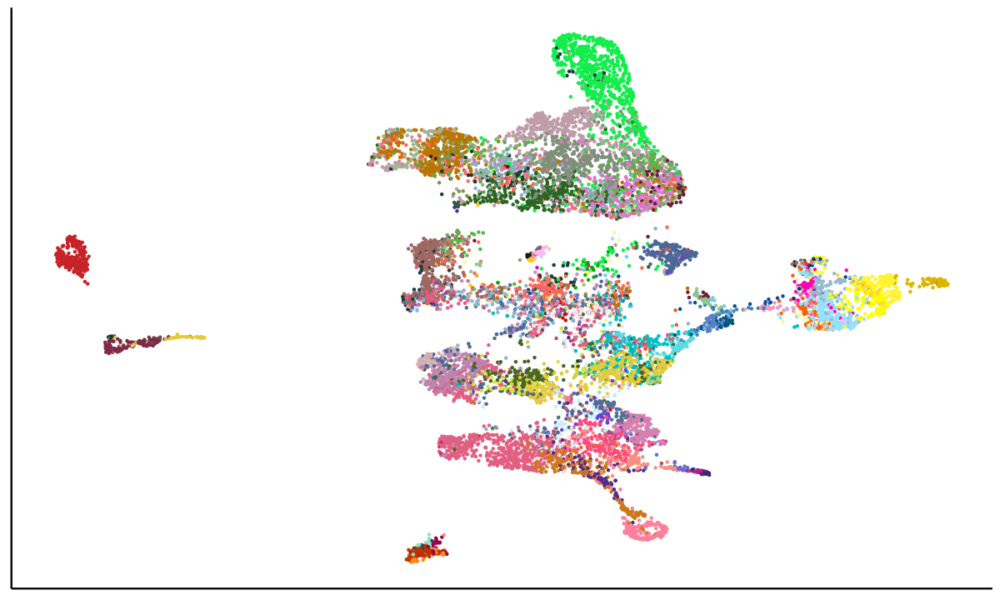

In [368]:
options(repr.plot.width=10, repr.plot.height=6)

ggplot(to.plot, aes_string(x="V1", y="V2", col='celltype.mapped_mnn')) +
    geom_point(size=0.2) +
    theme_classic() +
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank()
    ) + scale_color_manual(values=opts$celltype.colors) +
      theme(
        legend.position="none",
        legend.title=element_blank())

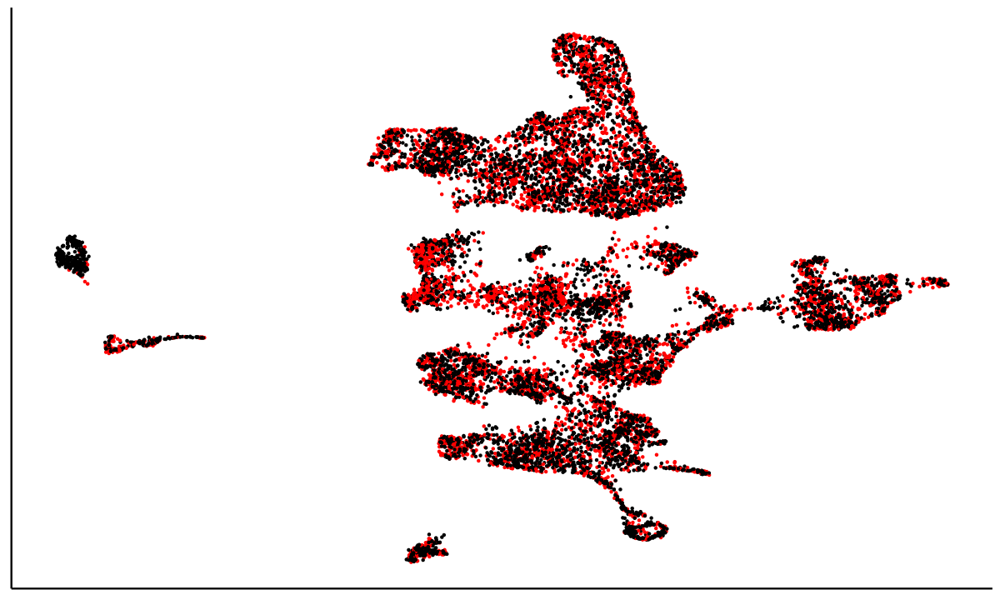

In [369]:
ggplot(to.plot, aes_string(x="V1", y="V2", col='tdTom')) +
    geom_point(size=0.2) +
    theme_classic() +
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank()
    ) + scale_color_manual(values=c('TRUE'= 'red', 'FALSE'='black')) +
      theme(
        legend.position="none",
        legend.title=element_blank())

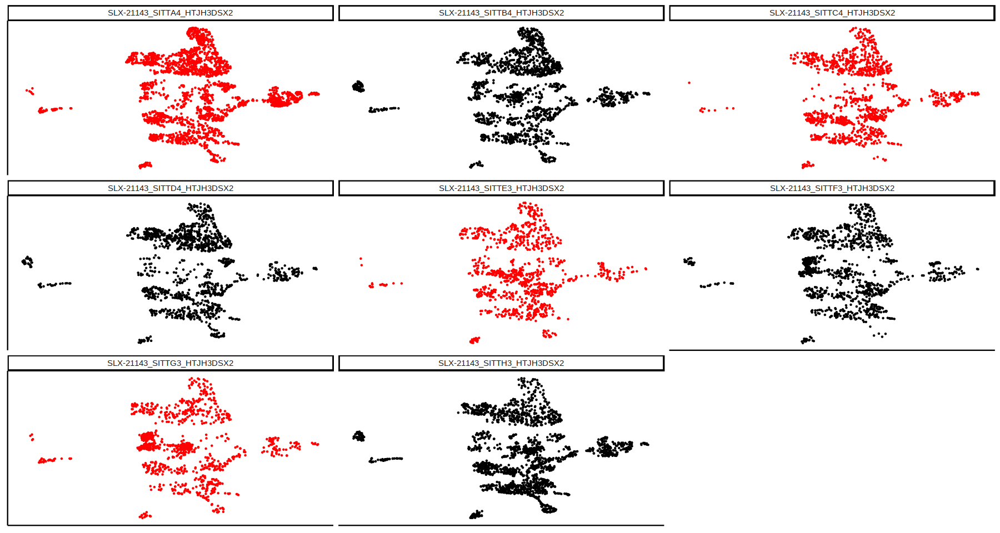

In [370]:
options(repr.plot.width=15, repr.plot.height=8)
ggplot(to.plot, aes_string(x="V1", y="V2", col='tdTom')) +
    geom_point(size=0.2) +
    theme_classic() +
    facet_wrap(~sample) + 
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank()
    ) + scale_color_manual(values=c('TRUE'= 'red', 'FALSE'='black')) +
      theme(
        legend.position="none",
        legend.title=element_blank())

In [371]:
########################
## Create MILO object ##
########################

# create object
Milo_sce <- Milo(sce_filt)

colData(Milo_sce)$sample_ko = paste0(colData(Milo_sce)$sample, '_',  colData(Milo_sce)$tdTom_corr)

# Build graph
Milo_sce <- buildGraph(Milo_sce, 
                       k = args$n_neighbors, 
                       d = args$npcs, 
                       reduced.dim = "PCA")

# Identify neighbourhoods from NN-cells
# lower prop for larger datasets
Milo_sce <- makeNhoods(Milo_sce, 
                       prop = args$prop, 
                       k = args$n_neighbors, 
                       d = args$npcs, 
                       refined = TRUE, 
                       reduced_dims = "PCA")

Constructing kNN graph with k:35

Checking valid object



In [372]:
# count cells of different samples per neighbourhood
Milo_sce <- countCells(Milo_sce, meta.data = as.data.frame(colData(Milo_sce)), sample="sample_ko")

# Calculate Neighbourhood Distances (most time consuming step)
Milo_sce <- calcNhoodDistance(Milo_sce, d=args$npcs, reduced.dim = "pca")

# Build neighbourhood graph
Milo_sce <- buildNhoodGraph(Milo_sce)

# Save MILO object
# outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s.rds",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
# saveRDS(Milo_sce, outfile)

# Embryo design table
embryo_design <- data.frame(colData(Milo_sce))[,c("sample_ko", "sample", 'tdTom_corr', 'tdTom', 'pool')]

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_ko



Checking meta.data validity

Counting cells in neighbourhoods



In [373]:
embryo_design

,sample_ko,sample,tdTom_corr,tdTom,pool
,<chr>,<chr>,<lgl>,<lgl>,<chr>
SLX-21143_SITTB4_HTJH3DSX2_FALSE,SLX-21143_SITTB4_HTJH3DSX2_FALSE,SLX-21143_SITTB4_HTJH3DSX2,FALSE,FALSE,E9.5_rep3
SLX-21143_SITTF3_HTJH3DSX2_FALSE,SLX-21143_SITTF3_HTJH3DSX2_FALSE,SLX-21143_SITTF3_HTJH3DSX2,FALSE,FALSE,E9.5_rep1
SLX-21143_SITTA4_HTJH3DSX2_TRUE,SLX-21143_SITTA4_HTJH3DSX2_TRUE,SLX-21143_SITTA4_HTJH3DSX2,TRUE,TRUE,E9.5_rep3
SLX-21143_SITTD4_HTJH3DSX2_FALSE,SLX-21143_SITTD4_HTJH3DSX2_FALSE,SLX-21143_SITTD4_HTJH3DSX2,FALSE,FALSE,E9.5_rep4
SLX-21143_SITTG3_HTJH3DSX2_TRUE,SLX-21143_SITTG3_HTJH3DSX2_TRUE,SLX-21143_SITTG3_HTJH3DSX2,TRUE,TRUE,E9.5_rep2
SLX-21143_SITTH3_HTJH3DSX2_FALSE,SLX-21143_SITTH3_HTJH3DSX2_FALSE,SLX-21143_SITTH3_HTJH3DSX2,FALSE,FALSE,E9.5_rep2
SLX-21143_SITTE3_HTJH3DSX2_TRUE,SLX-21143_SITTE3_HTJH3DSX2_TRUE,SLX-21143_SITTE3_HTJH3DSX2,TRUE,TRUE,E9.5_rep1
SLX-21143_SITTC4_HTJH3DSX2_TRUE,SLX-21143_SITTC4_HTJH3DSX2_TRUE,SLX-21143_SITTC4_HTJH3DSX2,TRUE,TRUE,E9.5_rep4


In [374]:
# Test differential abundance per hood
# Correction per stage skipped because this info is present in the pool, which also corrects for differences between embryos of the same stage
da_results <- testNhoods(Milo_sce, design = ~ pool + tdTom_corr, design.df = embryo_design, reduced.dim="PCA")

# Save MILO results
# outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_DAresults.csv",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
# write.csv(da_results, outfile, row.names=FALSE)

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Warning message:
“ggrepel: 40 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


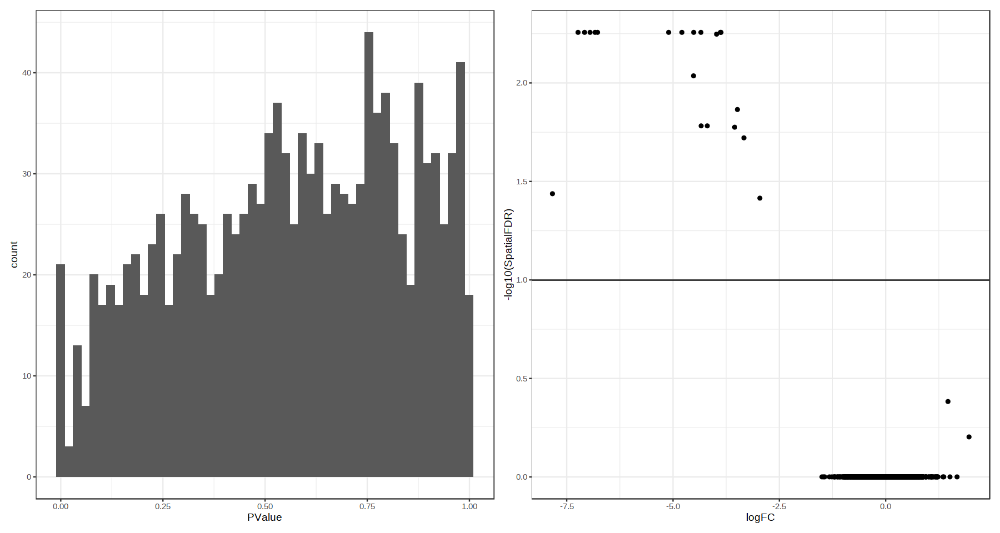

Converting celltype.mapped_mnn to factor...

Converting group.by to factor...



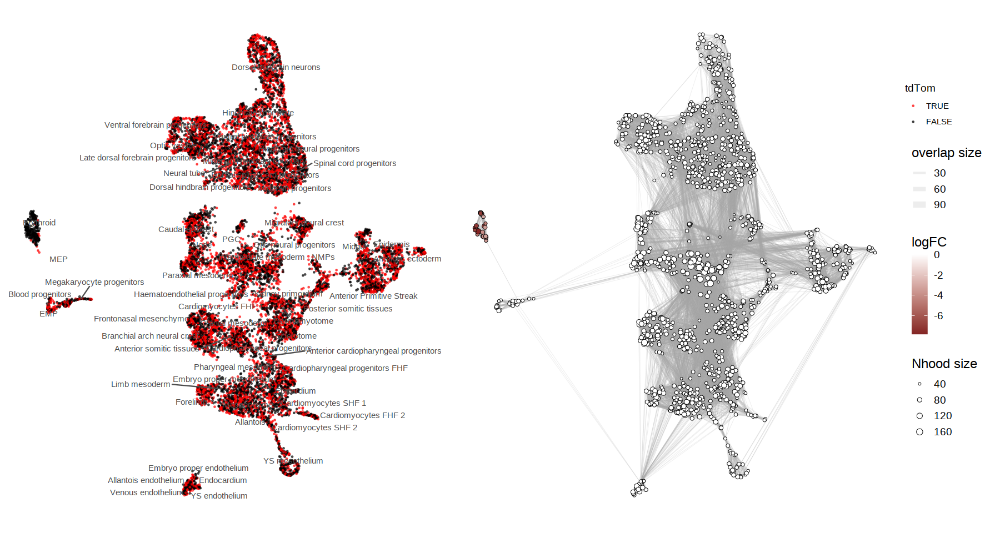

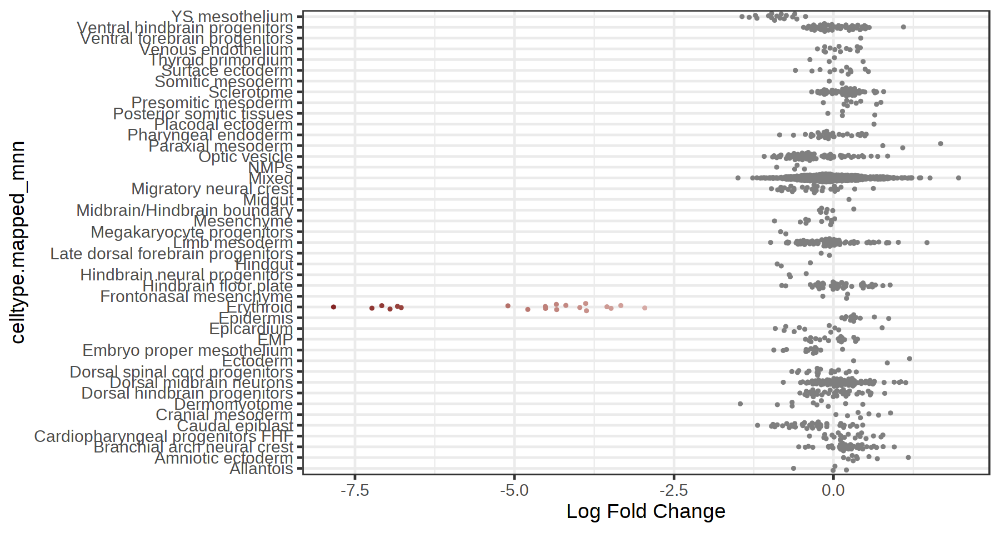

In [375]:
##################
## Plot results ##
##################

p1 = ggplot(da_results, aes(PValue)) + 
    geom_histogram(bins=50) + 
    theme_bw()

p2 = ggplot(da_results, aes(logFC, -log10(SpatialFDR))) + 
    geom_point() +
    geom_hline(yintercept = 1) + ## Mark significance threshold (10% FDR)
    theme_bw()


## Plot single-cell UMAP
p3 = plotReducedDim(Milo_sce, dimred = "UMAP", colour_by="tdTom_corr", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.3, text_colour = "grey30") +
    scale_color_manual(values=opts$tdTom.color, name = 'tdTom') + 
    theme_void() + 
    theme(legend.position='right') +
    guides(fill="none")

## Plot neighbourhood graph
p4 = plotNhoodGraphDA(Milo_sce, da_results, layout="UMAP",alpha=0.05) 

# # plot stats + graphs
# outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_plots.pdf",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
# pdf(outfile, width=14, height = 7)
#     p1 + p2
#     p3 + p4 +
#       plot_layout(guides="collect")
# dev.off()

# # If significant results create beeswarm plot
# if(TRUE %in% unique(da_results$SpatialFDR < 0.05)){
#     # Find Neighbourhood groups
#     da_results <- groupNhoods(Milo_sce, da_results, max.lfc.delta = 0.5, overlap = 20)

#     # Annotate hoods by celltype
#     da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")

#     # Annotate 'mixed' hoods when there is not one main celltype
#     da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.55, "Mixed", da_results$celltype.mapped_mnn)

#     # Save MILO object
#     outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_DAresults.csv",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
#     write.csv(da_results, outfile, row.names=FALSE)
    
#     # plot DA beeswarm
#     p6 = plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")

#     # # save beeswarm
#     outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_beeswarm.pdf",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
#     pdf(outfile, width=14, height = length(unique(da_results$celltype.mapped_mnn))/2.5)
#         print(p6)
#     dev.off()
# }

    p1 + p2
    p3 + p4 +
      plot_layout(guides="collect")

da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")
da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.5, "Mixed", da_results$celltype.mapped_mnn)
p6 = plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")
p6

In [456]:
# Additionally there are some paternally or maternally expressed genes to remove
gene_biomart = fread('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Mmusculus_genes_BioMart.87.txt')

imprint = gene_biomart[c(grep('maternally', gene_biomart$description),
                       grep('paternally', gene_biomart$description)), symbol]

In [457]:
imprint

[1] "Meg3"  "H19"   "Peg13" "Peg10" "Peg3"  "Peg12"

Other imprinted genes: 
- Nnat (https://www.genecards.org/cgi-bin/carddisp.pl?gene=NNAT)
- Grb10 (https://www.genecards.org/cgi-bin/carddisp.pl?gene=GRB10)

In [458]:
## Find HVGs - detection on WT samples only
# Get gene metadata
gene_metadata <- fread(io$gene_metadata) %>% .[,c("chr","ens_id","symbol")] %>%
  .[symbol!="" & ens_id%in%rownames(sce)] %>%
  .[!duplicated(symbol)]

decomp <- modelGeneVar(sce[,sample_metadata[tdTom==FALSE, cell]], block=colData(sce[,sample_metadata[tdTom==FALSE, cell]])$sample) # Only detect HVGs from WT samples
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>% 
    as.data.table(., keep.rownames=T) %>% 
    .[grep("^Rik|Rik$|^mt-|^Rps|^Rpl|^Gm",rn,invert=T)] %>% # filter out non-informative genes
    .[grep("^Hbb|^Hba",rn,invert=T)] %>% # test removing Haem genes 
    #.[!rn %in% c('Sfrp1', 'Grb10', 'H19', 'Peg10', 'Peg3', 'Nnat')] %>% # re-occuring batch genes
    .[!rn %in% c(imprint, 'Grb10', 'Nnat')] %>%  # remove imprinted genes
    .[!rn %in% c("Xist", "Tsix")] %>%  # remove Xist & Tsix
    .[!rn=="tomato-td"] %>% # remove tomato itself
    .[!rn%in%gene_metadata[chr=="chrY",symbol]] %>%
     head(n=args$features) %>% .$rn

sce_filt <- sce[hvgs,]

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


In [459]:
sce_filt_bu = sce_filt

In [460]:
if(args$regression){
   args$vars_to_regress = c('nFeature_RNA', 'nCount_RNA') # , 'mitochondrial_percent_RNA', 'ribosomal_percent_RNA'
   print(sprintf("Regressing out variables: %s", paste(args$vars_to_regress,collapse=" ")))
   logcounts(sce_filt) <- RegressOutMatrix(
     mtx = logcounts(sce_filt), 
     covariates = colData(sce_filt)[,args$vars_to_regress,drop=F]
   )
}

[1] "Regressing out variables: nFeature_RNA nCount_RNA"


In [461]:
sce_filt <- runPCA(sce_filt, ncomponents = args$npcs, ntop=args$features)  

sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = args$n_neighbors, min_dist = 0.3)


In [462]:
# Fetch UMAP coordinates
umap.dt <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
  .[,cell:=colnames(sce_filt)] %>%
  setnames(c("UMAP1","UMAP2","cell"))

In [463]:
to.plot <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
    .[,cell:=colnames(sce_filt)] %>%
    merge(sample_metadata, by="cell")

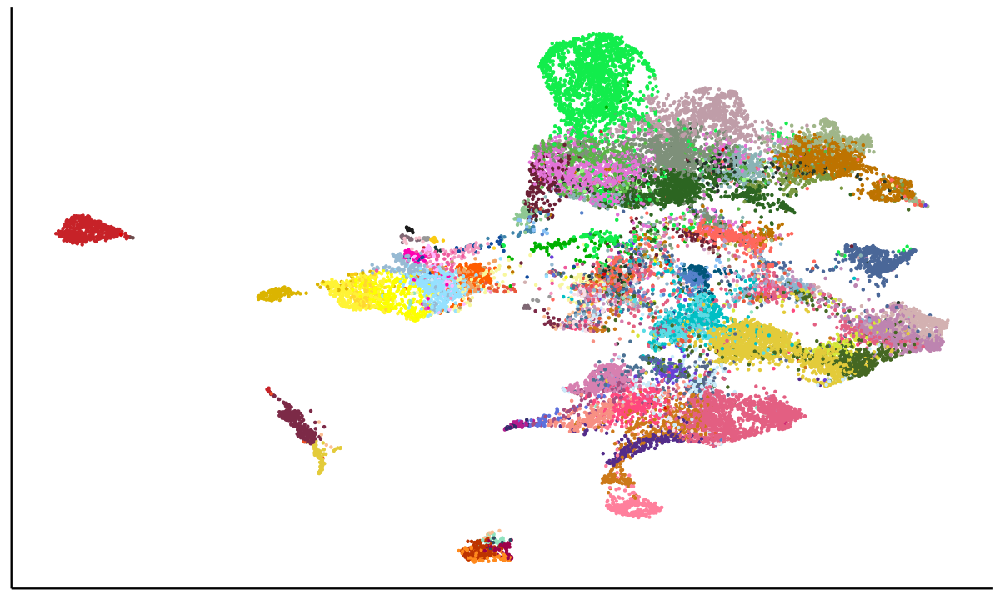

In [464]:
options(repr.plot.width=10, repr.plot.height=6)

ggplot(to.plot, aes_string(x="V1", y="V2", col='celltype.mapped_mnn')) +
    geom_point(size=0.2) +
    theme_classic() +
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank()
    ) + scale_color_manual(values=opts$celltype.colors) +
      theme(
        legend.position="none",
        legend.title=element_blank())

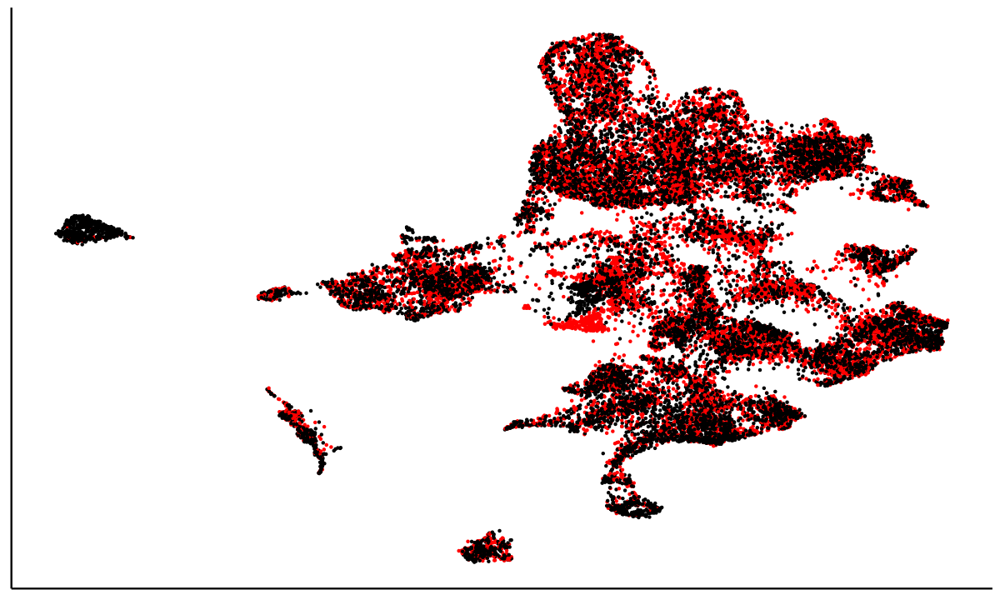

In [465]:
ggplot(to.plot, aes_string(x="V1", y="V2", col='tdTom')) +
    geom_point(size=0.2) +
    theme_classic() +
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank()
    ) + scale_color_manual(values=c('TRUE'= 'red', 'FALSE'='black')) +
      theme(
        legend.position="none",
        legend.title=element_blank())

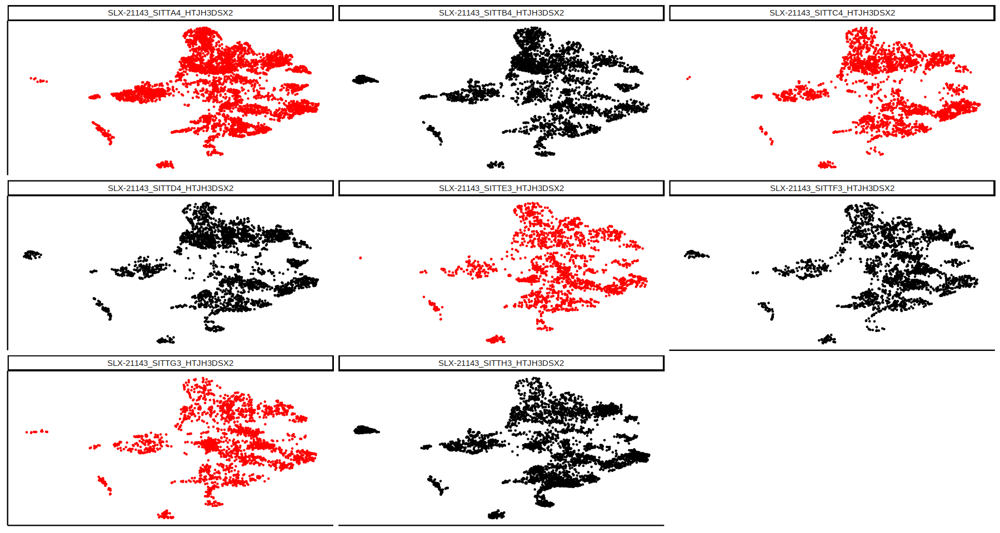

In [466]:
options(repr.plot.width=15, repr.plot.height=8)
ggplot(to.plot, aes_string(x="V1", y="V2", col='tdTom')) +
    geom_point(size=0.2) +
    theme_classic() +
    facet_wrap(~sample) + 
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank()
    ) + scale_color_manual(values=c('TRUE'= 'red', 'FALSE'='black')) +
      theme(
        legend.position="none",
        legend.title=element_blank())

In [467]:
########################
## Create MILO object ##
########################

# create object
Milo_sce <- Milo(sce_filt)

colData(Milo_sce)$sample_ko = paste0(colData(Milo_sce)$sample, '_',  colData(Milo_sce)$tdTom_corr)

# Build graph
Milo_sce <- buildGraph(Milo_sce, 
                       k = args$n_neighbors, 
                       d = args$npcs, 
                       reduced.dim = "PCA")

# Identify neighbourhoods from NN-cells
# lower prop for larger datasets
Milo_sce <- makeNhoods(Milo_sce, 
                       prop = args$prop, 
                       k = args$n_neighbors, 
                       d = args$npcs, 
                       refined = TRUE, 
                       reduced_dims = "PCA")

Constructing kNN graph with k:35

Checking valid object



In [ ]:
# count cells of different samples per neighbourhood
Milo_sce <- countCells(Milo_sce, meta.data = as.data.frame(colData(Milo_sce)), sample="sample_ko")

# Calculate Neighbourhood Distances (most time consuming step)
Milo_sce <- calcNhoodDistance(Milo_sce, d=args$npcs, reduced.dim = "pca")

# Build neighbourhood graph
Milo_sce <- buildNhoodGraph(Milo_sce)

# Save MILO object
# outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s.rds",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
# saveRDS(Milo_sce, outfile)

# Embryo design table
embryo_design <- data.frame(colData(Milo_sce))[,c("sample_ko", "sample", 'tdTom_corr', 'tdTom', 'pool')]

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_ko



Checking meta.data validity

Counting cells in neighbourhoods



In [ ]:
embryo_design

In [ ]:
# Test differential abundance per hood
# Correction per stage skipped because this info is present in the pool, which also corrects for differences between embryos of the same stage
da_results <- testNhoods(Milo_sce, design = ~ pool + tdTom_corr, design.df = embryo_design, reduced.dim="PCA")

# Save MILO results
# outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_DAresults.csv",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
# write.csv(da_results, outfile, row.names=FALSE)

In [ ]:
##################
## Plot results ##
##################

p1 = ggplot(da_results, aes(PValue)) + 
    geom_histogram(bins=50) + 
    theme_bw()

p2 = ggplot(da_results, aes(logFC, -log10(SpatialFDR))) + 
    geom_point() +
    geom_hline(yintercept = 1) + ## Mark significance threshold (10% FDR)
    theme_bw()


## Plot single-cell UMAP
p3 = plotReducedDim(Milo_sce, dimred = "UMAP", colour_by="tdTom_corr", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.3, text_colour = "grey30") +
    scale_color_manual(values=opts$tdTom.color, name = 'tdTom') + 
    theme_void() + 
    theme(legend.position='right') +
    guides(fill="none")

## Plot neighbourhood graph
p4 = plotNhoodGraphDA(Milo_sce, da_results, layout="UMAP",alpha=0.05) 

# # plot stats + graphs
# outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_plots.pdf",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
# pdf(outfile, width=14, height = 7)
#     p1 + p2
#     p3 + p4 +
#       plot_layout(guides="collect")
# dev.off()

# # If significant results create beeswarm plot
# if(TRUE %in% unique(da_results$SpatialFDR < 0.05)){
#     # Find Neighbourhood groups
#     da_results <- groupNhoods(Milo_sce, da_results, max.lfc.delta = 0.5, overlap = 20)

#     # Annotate hoods by celltype
#     da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")

#     # Annotate 'mixed' hoods when there is not one main celltype
#     da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.55, "Mixed", da_results$celltype.mapped_mnn)

#     # Save MILO object
#     outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_DAresults.csv",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
#     write.csv(da_results, outfile, row.names=FALSE)
    
#     # plot DA beeswarm
#     p6 = plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")

#     # # save beeswarm
#     outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_beeswarm.pdf",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
#     pdf(outfile, width=14, height = length(unique(da_results$celltype.mapped_mnn))/2.5)
#         print(p6)
#     dev.off()
# }

    p1 + p2
    p3 + p4 +
      plot_layout(guides="collect")

da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")
da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.5, "Mixed", da_results$celltype.mapped_mnn)
p6 = plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")
p6

# Remove blood

In [429]:
## Find HVGs - detection on WT samples only
# Get gene metadata
gene_metadata <- fread(io$gene_metadata) %>% .[,c("chr","ens_id","symbol")] %>%
  .[symbol!="" & ens_id%in%rownames(sce)] %>%
  .[!duplicated(symbol)]

# Imprinted genes
imprint = gene_metadata[c(grep('maternally', gene_metadata$description),
                       grep('paternally', gene_metadata$description)), symbol]
#Other imprinted genes: 
#- Nnat (https://www.genecards.org/cgi-bin/carddisp.pl?gene=NNAT)
#- Grb10 (https://www.genecards.org/cgi-bin/carddisp.pl?gene=GRB10)

decomp <- modelGeneVar(sce[,sample_metadata[tdTom==FALSE, cell]], block=colData(sce[,sample_metadata[tdTom==FALSE, cell]])$sample) # Only detect HVGs from WT samples
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>% 
    as.data.table(., keep.rownames=T) %>% 
    .[grep("^Rik|Rik$|^mt-|^Rps|^Rpl|^Gm",rn,invert=T)] %>% # filter out non-informative genes
    .[grep("^Hbb|^Hba",rn,invert=T)] %>% # test removing Haem genes 
    .[!rn %in% c(imprint, 'Grb10', 'Nnat')] %>%  # remove imprinted genes
    .[!rn %in% c("Xist", "Tsix")] %>%  # remove Xist & Tsix
    .[!rn=="tomato-td"] %>% # remove tomato itself
    .[!rn%in%gene_metadata[chr=="chrY",symbol]] %>%
     head(n=args$features) %>% .$rn

sce_filt <- sce[hvgs,]

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


In [430]:
sce_filt

class: SingleCellExperiment 
dim: 2000 12771 
metadata(0):
assays(2): counts logcounts
rownames(2000): Tmsb4x Crabp1 ... Mylk Twist2
rowData names(0):
colnames(12771): SLX-21143_SITTB4_HTJH3DSX2#GCTGGGTCATGAAAGT-1
  SLX-21143_SITTF3_HTJH3DSX2#TGATGGTTCCTCTCGA-1 ...
  SLX-21143_SITTE3_HTJH3DSX2#TTTACGTCAGCGTGCT-1
  SLX-21143_SITTD4_HTJH3DSX2#ACGATGTTCGGCAGTC-1
colData names(19): sample barcode ... closest.cell_mnn pool
reducedDimNames(1): PCA
mainExpName: RNA
altExpNames(0):

In [431]:
sce_filt = sce_filt[,sample_metadata[celltype.mapped_mnn != 'Erythroid', cell]]

In [432]:
sce_filt

class: SingleCellExperiment 
dim: 2000 12495 
metadata(0):
assays(2): counts logcounts
rownames(2000): Tmsb4x Crabp1 ... Mylk Twist2
rowData names(0):
colnames(12495): SLX-21143_SITTF3_HTJH3DSX2#TGATGGTTCCTCTCGA-1
  SLX-21143_SITTA4_HTJH3DSX2#TAACTTCAGTACAGAT-1 ...
  SLX-21143_SITTE3_HTJH3DSX2#TTTACGTCAGCGTGCT-1
  SLX-21143_SITTD4_HTJH3DSX2#ACGATGTTCGGCAGTC-1
colData names(19): sample barcode ... closest.cell_mnn pool
reducedDimNames(1): PCA
mainExpName: RNA
altExpNames(0):

In [433]:
sce_filt_bu = sce_filt

In [434]:
if(args$regression){
   args$vars_to_regress = c('nFeature_RNA', 'nCount_RNA') # , 'mitochondrial_percent_RNA', 'ribosomal_percent_RNA'
   print(sprintf("Regressing out variables: %s", paste(args$vars_to_regress,collapse=" ")))
   logcounts(sce_filt) <- RegressOutMatrix(
     mtx = logcounts(sce_filt), 
     covariates = colData(sce_filt)[,args$vars_to_regress,drop=F]
   )
}

[1] "Regressing out variables: nFeature_RNA nCount_RNA"


In [435]:
sce_filt <- runPCA(sce_filt, ncomponents = args$npcs, ntop=args$features)  

sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = args$n_neighbors, min_dist = 0.3)


In [436]:
# Fetch UMAP coordinates
umap.dt <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
  .[,cell:=colnames(sce_filt)] %>%
  setnames(c("UMAP1","UMAP2","cell"))

In [437]:
to.plot <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
    .[,cell:=colnames(sce_filt)] %>%
    merge(sample_metadata, by="cell")

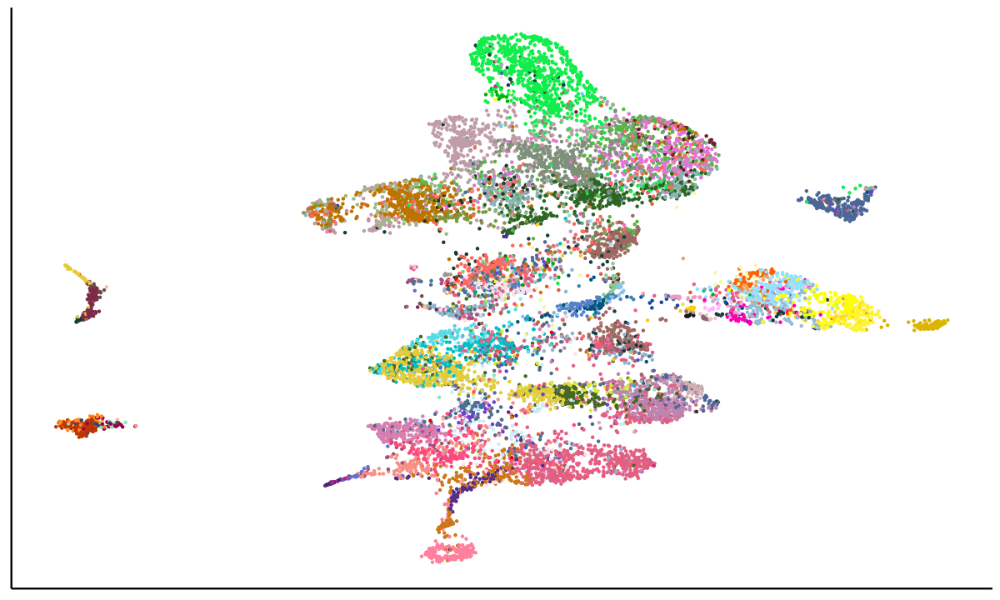

In [438]:
options(repr.plot.width=10, repr.plot.height=6)

ggplot(to.plot, aes_string(x="V1", y="V2", col='celltype.mapped_mnn')) +
    geom_point(size=0.2) +
    theme_classic() +
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank()
    ) + scale_color_manual(values=opts$celltype.colors) +
      theme(
        legend.position="none",
        legend.title=element_blank())

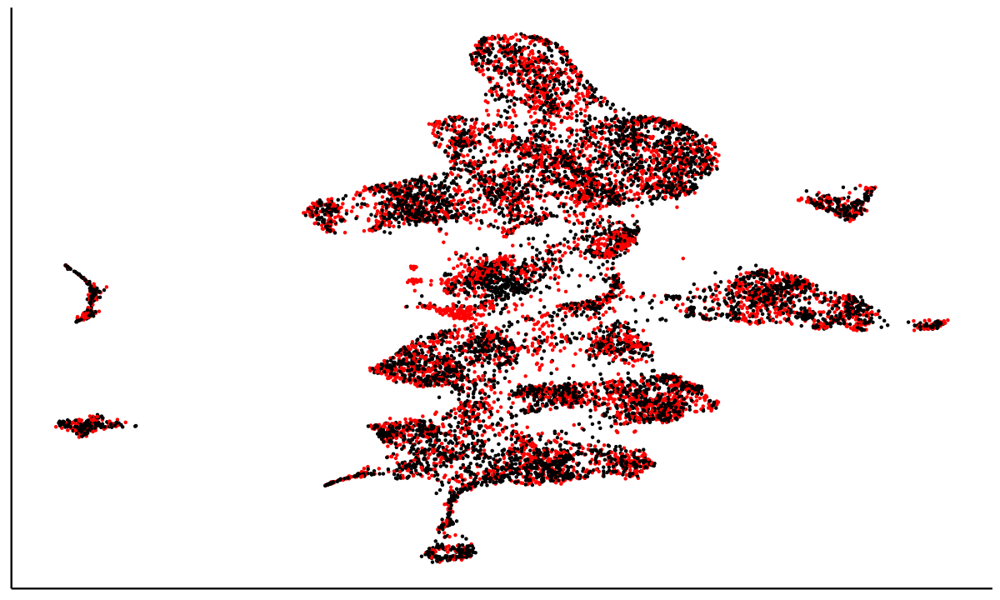

In [439]:
ggplot(to.plot, aes_string(x="V1", y="V2", col='tdTom')) +
    geom_point(size=0.2) +
    theme_classic() +
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank()
    ) + scale_color_manual(values=c('TRUE'= 'red', 'FALSE'='black')) +
      theme(
        legend.position="none",
        legend.title=element_blank())

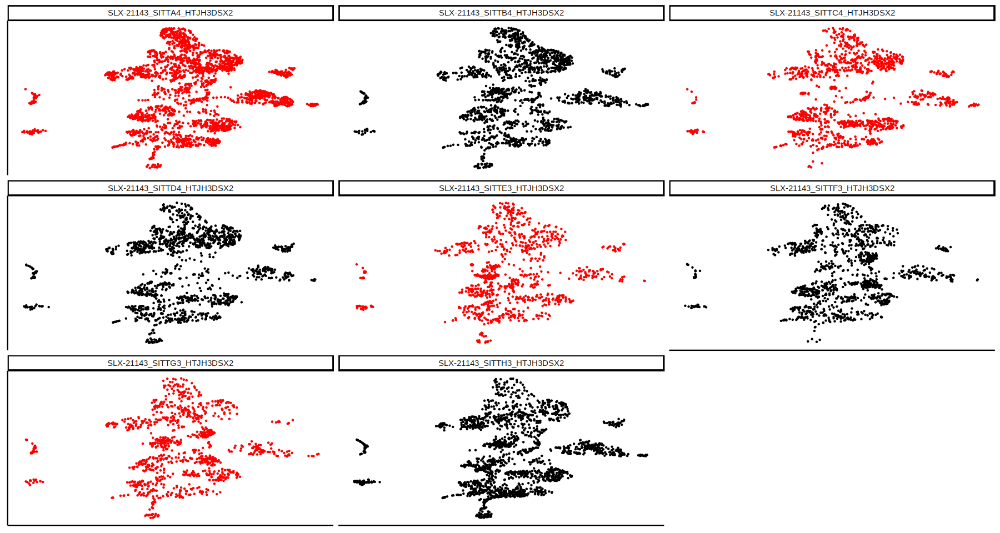

In [440]:
options(repr.plot.width=15, repr.plot.height=8)
ggplot(to.plot, aes_string(x="V1", y="V2", col='tdTom')) +
    geom_point(size=0.2) +
    theme_classic() +
    facet_wrap(~sample) + 
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank()
    ) + scale_color_manual(values=c('TRUE'= 'red', 'FALSE'='black')) +
      theme(
        legend.position="none",
        legend.title=element_blank())

In [441]:
########################
## Create MILO object ##
########################

# create object
Milo_sce <- Milo(sce_filt)

colData(Milo_sce)$sample_ko = paste0(colData(Milo_sce)$sample, '_',  colData(Milo_sce)$tdTom_corr)

# Build graph
Milo_sce <- buildGraph(Milo_sce, 
                       k = args$n_neighbors, 
                       d = args$npcs, 
                       reduced.dim = "PCA")

# Identify neighbourhoods from NN-cells
# lower prop for larger datasets
Milo_sce <- makeNhoods(Milo_sce, 
                       prop = args$prop, 
                       k = args$n_neighbors, 
                       d = args$npcs, 
                       refined = TRUE, 
                       reduced_dims = "PCA")

Constructing kNN graph with k:35

Checking valid object



In [442]:
# count cells of different samples per neighbourhood
Milo_sce <- countCells(Milo_sce, meta.data = as.data.frame(colData(Milo_sce)), sample="sample_ko")

# Calculate Neighbourhood Distances (most time consuming step)
Milo_sce <- calcNhoodDistance(Milo_sce, d=args$npcs, reduced.dim = "pca")

# Build neighbourhood graph
Milo_sce <- buildNhoodGraph(Milo_sce)

# Save MILO object
# outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s.rds",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
# saveRDS(Milo_sce, outfile)

# Embryo design table
embryo_design <- data.frame(colData(Milo_sce))[,c("sample_ko", "sample", 'tdTom_corr', 'tdTom', 'pool')]

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_ko



Checking meta.data validity

Counting cells in neighbourhoods



In [447]:
embryo_design %>% rownames

[1] "SLX-21143_SITTF3_HTJH3DSX2_FALSE" "SLX-21143_SITTA4_HTJH3DSX2_TRUE" 
[3] "SLX-21143_SITTD4_HTJH3DSX2_FALSE" "SLX-21143_SITTG3_HTJH3DSX2_TRUE" 
[5] "SLX-21143_SITTH3_HTJH3DSX2_FALSE" "SLX-21143_SITTE3_HTJH3DSX2_TRUE" 
[7] "SLX-21143_SITTB4_HTJH3DSX2_FALSE" "SLX-21143_SITTC4_HTJH3DSX2_TRUE"

In [444]:
# Test differential abundance per hood
# Correction per stage skipped because this info is present in the pool, which also corrects for differences between embryos of the same stage
da_results <- testNhoods(Milo_sce, design = ~ pool + tdTom_corr, design.df = embryo_design, reduced.dim="PCA")

# Save MILO results
# outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_DAresults.csv",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
# write.csv(da_results, outfile, row.names=FALSE)

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Warning message:
“ggrepel: 41 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


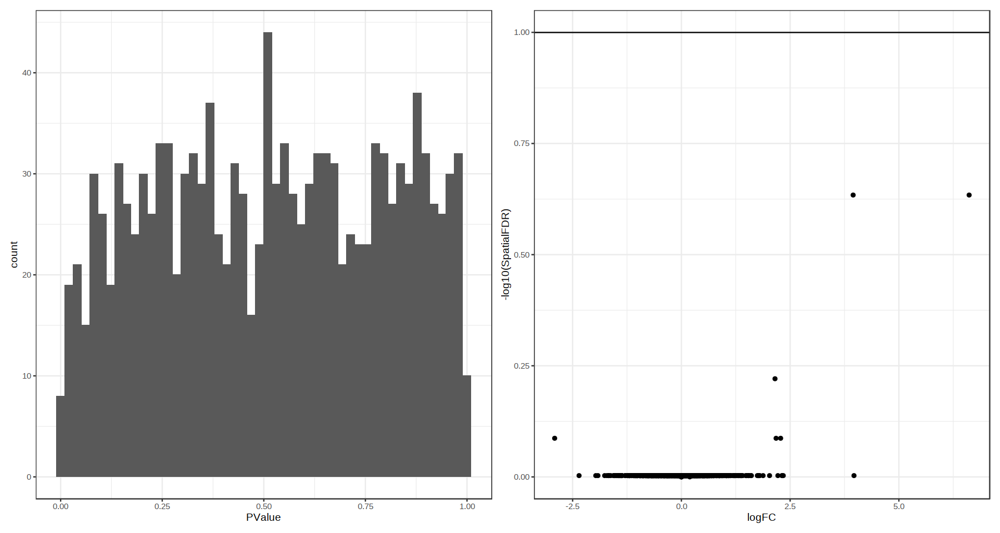

Converting celltype.mapped_mnn to factor...



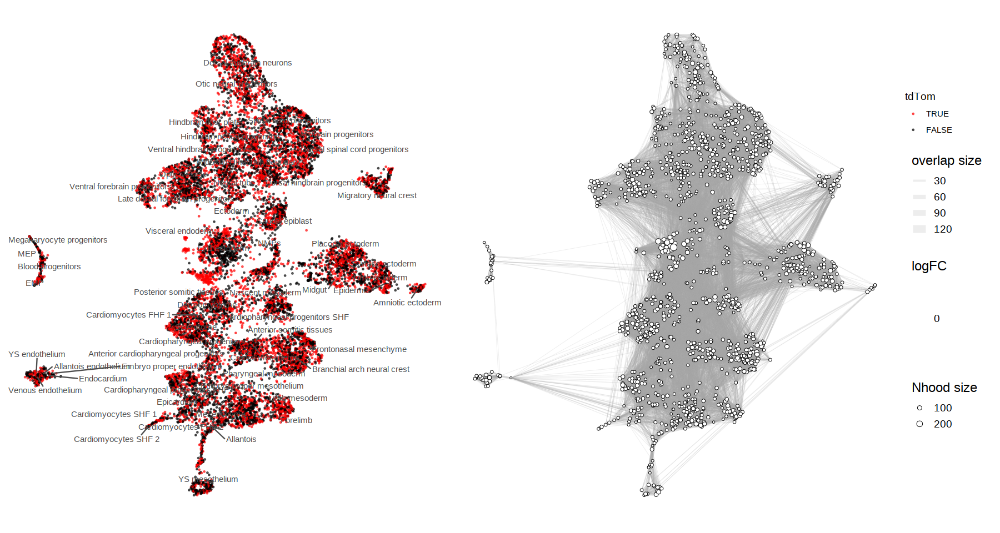

In [446]:
##################
## Plot results ##
##################

p1 = ggplot(da_results, aes(PValue)) + 
    geom_histogram(bins=50) + 
    theme_bw()

p2 = ggplot(da_results, aes(logFC, -log10(SpatialFDR))) + 
    geom_point() +
    geom_hline(yintercept = 1) + ## Mark significance threshold (10% FDR)
    theme_bw()


## Plot single-cell UMAP
p3 = plotReducedDim(Milo_sce, dimred = "UMAP", colour_by="tdTom_corr", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.3, text_colour = "grey30") +
    scale_color_manual(values=opts$tdTom.color, name = 'tdTom') + 
    theme_void() + 
    theme(legend.position='right') +
    guides(fill="none")

## Plot neighbourhood graph
p4 = plotNhoodGraphDA(Milo_sce, da_results, layout="UMAP",alpha=0.05) 

# # plot stats + graphs
# outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_plots.pdf",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
# pdf(outfile, width=14, height = 7)
#     p1 + p2
#     p3 + p4 +
#       plot_layout(guides="collect")
# dev.off()

# # If significant results create beeswarm plot
# if(TRUE %in% unique(da_results$SpatialFDR < 0.05)){
#     # Find Neighbourhood groups
#     da_results <- groupNhoods(Milo_sce, da_results, max.lfc.delta = 0.5, overlap = 20)

#     # Annotate hoods by celltype
#     da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")

#     # Annotate 'mixed' hoods when there is not one main celltype
#     da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.55, "Mixed", da_results$celltype.mapped_mnn)

#     # Save MILO object
#     outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_DAresults.csv",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
#     write.csv(da_results, outfile, row.names=FALSE)
    
#     # plot DA beeswarm
#     p6 = plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")

#     # # save beeswarm
#     outfile = sprintf("%s/results/rna/MiloR/%s_Milo_features%d_pcs%d_tdTomcorr%s_beeswarm.pdf",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs, args$tdTom_corr)
#     pdf(outfile, width=14, height = length(unique(da_results$celltype.mapped_mnn))/2.5)
#         print(p6)
#     dev.off()
# }

    p1 + p2
    p3 + p4 +
      plot_layout(guides="collect")

da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")
da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.5, "Mixed", da_results$celltype.mapped_mnn)
#p6 = plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")
#p6

In [452]:
umap.dt %>% %>% .$UMAP1

ERROR: Error in parse(text = x, srcfile = src): <text>:1:13: unexpected SPECIAL
1: umap.dt %>% %>%
                ^


In [449]:
reducedDim(sce_filt,"UMAP") = reducedDim(sce_filt,"UMAP")